# Final project: computer vision course

Diplomado en Automatización

In [ ]:
!cp -r drive/MyDrive/Coffee\ beans\ -\ Dataset .

Import useful libraries to work with

In [ ]:
%matplotlib inline

import os
import shutil
import random
import torch
import torchvision
import numpy as np
import cv2
from tqdm.notebook import tqdm

from PIL import Image
from matplotlib import pyplot as plt

print("pytorch Version: ", torch.__version__)

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(device)

pytorch Version:  1.9.0+cu102
cuda


In [ ]:
img = cv2.imread("Coffee beans - Dataset/bad/01aff576-d811-4858-bc7b-e66af9db530f.jpg")
print(img.shape)

(425, 424, 3)


Class used to load the Coffee beans Dataset

In [ ]:
class fall_samples_dataset(torch.utils.data.Dataset):
    def __init__(self, image_dirs, transform):
        def get_images(class_name):
            images = [x for x in os.listdir(image_dirs[class_name]) if x[-3:].lower().endswith('jpg')]
            print(f'Found {len(images)} {class_name} examples')
            return images

        self.images = {}
        self.class_names = ['bad', 'good']
        for class_name in self.class_names:
            self.images[class_name] = get_images(class_name)

        self.image_dirs = image_dirs
        self.transform = transform

    def __len__(self):
        return sum([len(self.images[class_name]) for class_name in self.class_names])

    def __getitem__(self, index):
        class_name = random.choice(self.class_names)
        index = index % len(self.images[class_name])
        image_name = self.images[class_name][index]
        image_path = os.path.join(self.image_dirs[class_name], image_name)
        image = Image.open(image_path).convert('RGB')
        return self.transform(image), self.class_names.index(class_name)

Transformations are used to train and test our model. Just for improving the model's robustness

In [ ]:
train_transform = torchvision.transforms.Compose([
    torchvision.transforms.Resize(size=(224,224)),
    torchvision.transforms.ColorJitter(brightness=0.1, contrast=0.2, saturation=0, hue=0),
    torchvision.transforms.RandomRotation(5),
    torchvision.transforms.RandomHorizontalFlip(),
    torchvision.transforms.ToTensor(),
    torchvision.transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                     std =[0.229, 0.224, 0.225])
])

test_transform = torchvision.transforms.Compose([
    torchvision.transforms.Resize(size=(224,224)),
    torchvision.transforms.ToTensor(),
    torchvision.transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                     std =[0.229, 0.224, 0.225])
])


Load the Dataset according to the data paths.

In [ ]:
train_dirs = {
    'bad': 'Coffee beans - Dataset/bad',
    'good': 'Coffee beans - Dataset/good'
}
print("Number of images por training data: ")
train_dataset = fall_samples_dataset(train_dirs, train_transform)

Number of images por training data: 
Found 434 bad examples
Found 1379 good examples


Set some hyperparameters:

    batch size = 32
    80% of Dataset to train
    20% of Dataset to test
    Shuffle data

In [ ]:
batch_size = 32
validation_split = .2
shuffle_dataset = True
random_seed= 42

dataset_size = len(train_dataset)
indices = list(range(dataset_size))
split = int(np.floor(validation_split * dataset_size))
if shuffle_dataset :
    np.random.seed(random_seed)
    np.random.shuffle(indices)
train_indices, val_indices = indices[split:], indices[:split]

train_sampler = torch.utils.data.sampler.SubsetRandomSampler(train_indices)
valid_sampler = torch.utils.data.sampler.SubsetRandomSampler(val_indices)

dl_train = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size,
                                           sampler=train_sampler)
dl_test = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size,
                                                sampler=valid_sampler)

In [ ]:
print("Number of batches of train data:  ",len(dl_train))
print("Number of batches of test data:  ", len(dl_test))

Number of batches of train data:   46
Number of batches of test data:   12


In [ ]:
print(type(dl_train))
print(type(dl_test))

<class 'torch.utils.data.dataloader.DataLoader'>
<class 'torch.utils.data.dataloader.DataLoader'>


In [ ]:
print(type(dl_train))
print(type(dl_test))

<class 'torch.utils.data.dataloader.DataLoader'>
<class 'torch.utils.data.dataloader.DataLoader'>


Functions to display true labels and predictions

In [ ]:
class_names = train_dataset.class_names

def show_images(images, labels, preds):
    plt.figure(figsize=(18,14))
    for i, image in enumerate(images):
        plt.subplot(1,32,i+1, xticks=[], yticks=[])
        image = image.cpu().numpy().transpose((1,2,0))
        mean = np.array([0.485, 0.456, 0.406])
        std = np.array([0.229, 0.224, 0.225])
        image = image * std + mean
        image = np.clip(image, 0., 1.)
        plt.imshow(image)
        col = 'green'
        if preds[i] !=labels[i]:
            col = 'red'

        plt.xlabel(f'{class_names[int(labels[i].cpu().numpy())]}')
        plt.ylabel(f'{class_names[int(preds[i].cpu().numpy())]}', color = col)

    plt.tight_layout()
    plt.show()

def show_preds(model):
    model.eval()
    images,labels = next(iter(dl_test))
    images,labels = images.to(device),labels.to(device)
    outputs = model(images)
    _, preds = torch.max(outputs, 1)
    show_images(images, labels, preds)

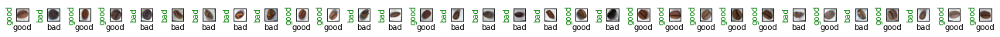

In [ ]:
images, labels = next(iter(dl_test))
show_images(images, labels, labels)

In [ ]:
resnet50 = torchvision.models.resnet50(pretrained=True).to(device)

for param in resnet50.parameters():
    param.requires_grad = False

resnet50.fc = torch.nn.Sequential(
               torch.nn.Linear(2048, 128),
               torch.nn.ReLU(inplace=True),
               torch.nn.Linear(128, 2)).to(device)
print(resnet50)
resnet50.to(device)
x = torch.randn(1, 3, 224, 224).to(device)
aa = resnet50(x)
print(aa)

Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth


  0%|          | 0.00/97.8M [00:00<?, ?B/s]

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
  return torch.max_pool2d(input, kernel_size, stride, padding, dilation, ceil_mode)


In [ ]:
vgg16 = torchvision.models.vgg16_bn(pretrained=True)

for param in vgg16.parameters():
    param.requires_grad = False

num_flts = vgg16.classifier[6].in_features
features = list(vgg16.classifier.children())[:-1]
features.extend([torch.nn.Linear(num_flts, 2)])
vgg16.classifier = torch.nn.Sequential(*features)

print(vgg16)

vgg16.to(device)
x = torch.randn(1, 3, 224, 224).to(device)
aa = vgg16(x)
print(aa)

Downloading: "https://download.pytorch.org/models/vgg16_bn-6c64b313.pth" to /root/.cache/torch/hub/checkpoints/vgg16_bn-6c64b313.pth


  0%|          | 0.00/528M [00:00<?, ?B/s]

VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (7): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (9): ReLU(inplace=True)
    (10): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (12): ReLU(inplace=True)
    (13): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (14): Conv2d(128, 256

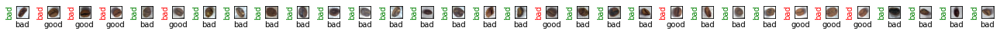

In [ ]:
show_preds(vgg16)

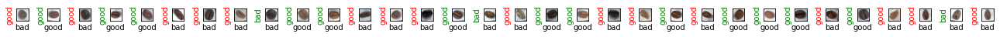

In [ ]:
show_preds(resnet50)

# training the model

In [ ]:

def train(epochs, model, learning_rate = 0.0001):
    print('Starting training . . . .')
    loss_fn = torch.nn.CrossEntropyLoss()
    optimizer = torch.optim.RMSprop(model.parameters(), lr = learning_rate)
    for e in range(0, epochs):
        print('='*20)
        print(f'Starting epoch {e+1}/{epochs}')
        print('='*20)
        train_loss = 0
        model.train()

        for train_step, (images, labels) in enumerate(dl_train):
            images = images.to(device)
            labels = labels.to(device)
            optimizer.zero_grad()
            outputs = model(images)
            loss = loss_fn(outputs, labels)
            loss.backward()
            optimizer.step()
            train_loss += loss.item()
            if train_step % 20 == 0:
                print('Evaluating at step ', train_step)
                acc = 0
                val_loss = 0
                model.eval()

                for val_step, (images, labels) in enumerate(dl_test):
                    images = images.to(device)
                    labels = labels.to(device)
                    outputs = model(images)
                    loss = loss_fn(outputs, labels)
                    val_loss += loss.item()

                    _, preds = torch.max(outputs, 1)
                    acc += sum((preds == labels).cpu().numpy())

                val_loss /= (val_step+1)
                acc = acc / (len(dl_test)*batch_size)

                print(f'Val loss: {val_loss:.4f}, Acc: {acc:.4f}')
                show_preds(model)

                model.train()

        train_loss /= (train_step + 1)
        print(f'Training Loss: {train_loss:.4f}')

Starting training . . . .
Starting epoch 1/10
Evaluating at step  0
Val loss: 0.7344, Acc: 0.4635


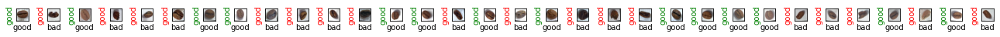

Evaluating at step  20
Val loss: 0.3952, Acc: 0.8229


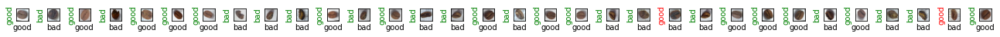

Evaluating at step  40
Val loss: 0.3615, Acc: 0.8385


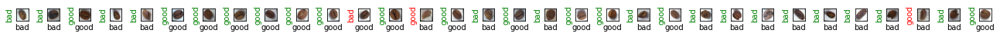

Training Loss: 0.4476
Starting epoch 2/10
Evaluating at step  0
Val loss: 0.3182, Acc: 0.8594


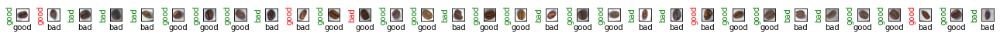

Evaluating at step  20
Val loss: 0.2922, Acc: 0.8620


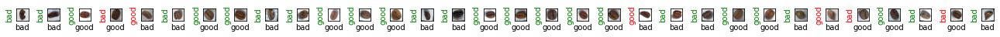

Evaluating at step  40
Val loss: 0.2841, Acc: 0.8698


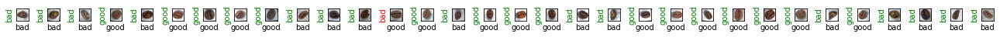

Training Loss: 0.3337
Starting epoch 3/10
Evaluating at step  0
Val loss: 0.3170, Acc: 0.8333


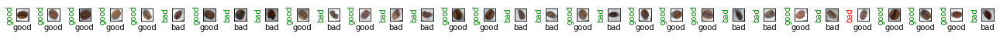

Evaluating at step  20
Val loss: 0.2541, Acc: 0.8698


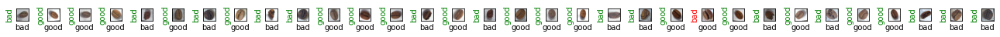

Evaluating at step  40
Val loss: 0.2563, Acc: 0.8594


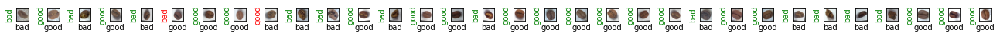

Training Loss: 0.3107
Starting epoch 4/10
Evaluating at step  0
Val loss: 0.2807, Acc: 0.8594


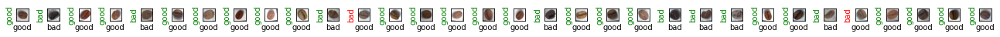

Evaluating at step  20
Val loss: 0.2521, Acc: 0.8698


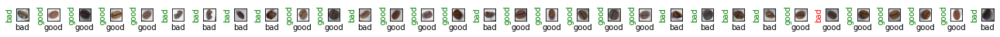

Evaluating at step  40
Val loss: 0.2320, Acc: 0.8698


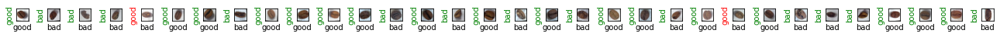

Training Loss: 0.2586
Starting epoch 5/10
Evaluating at step  0
Val loss: 0.2385, Acc: 0.8776


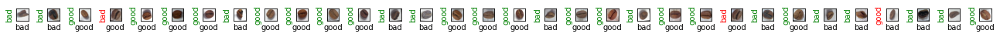

Evaluating at step  20
Val loss: 0.2311, Acc: 0.8724


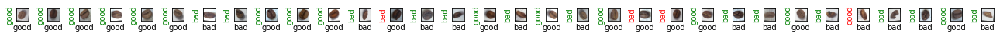

Evaluating at step  40
Val loss: 0.2206, Acc: 0.8724


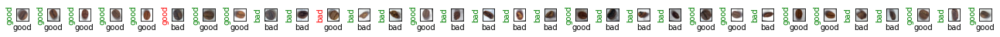

Training Loss: 0.2420
Starting epoch 6/10
Evaluating at step  0
Val loss: 0.2069, Acc: 0.8724


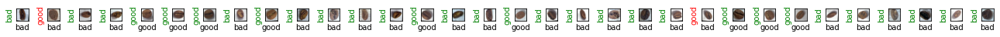

Evaluating at step  20
Val loss: 0.2073, Acc: 0.8828


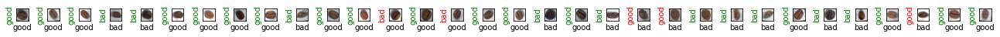

Evaluating at step  40
Val loss: 0.2174, Acc: 0.8776


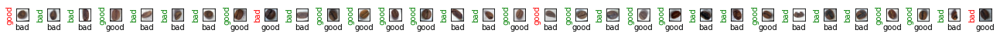

Training Loss: 0.2454
Starting epoch 7/10
Evaluating at step  0
Val loss: 0.2253, Acc: 0.8698


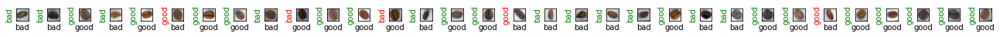

Evaluating at step  20
Val loss: 0.2147, Acc: 0.8646


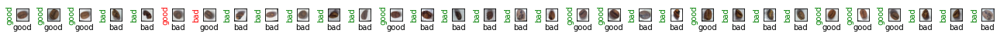

Evaluating at step  40
Val loss: 0.2079, Acc: 0.8698


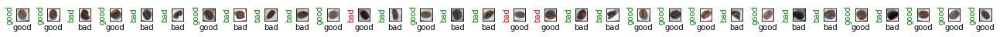

Training Loss: 0.2294
Starting epoch 8/10
Evaluating at step  0
Val loss: 0.2023, Acc: 0.8620


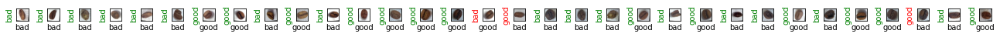

Evaluating at step  20
Val loss: 0.1701, Acc: 0.8854


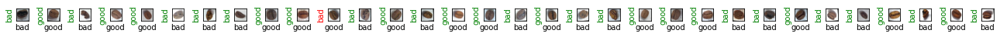

Evaluating at step  40
Val loss: 0.2018, Acc: 0.8958


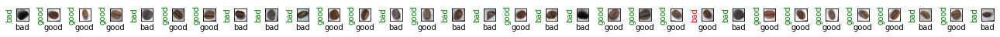

Training Loss: 0.2230
Starting epoch 9/10
Evaluating at step  0
Val loss: 0.2073, Acc: 0.8776


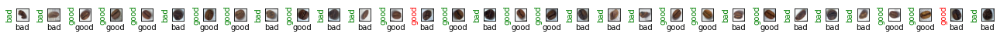

Evaluating at step  20
Val loss: 0.1886, Acc: 0.8776


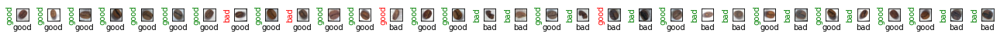

Evaluating at step  40
Val loss: 0.1972, Acc: 0.8672


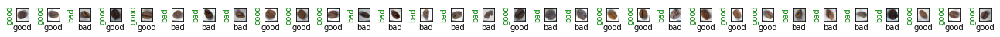

Training Loss: 0.2176
Starting epoch 10/10
Evaluating at step  0
Val loss: 0.1809, Acc: 0.8802


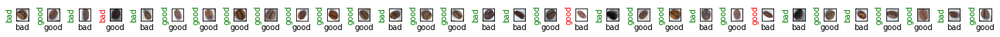

Evaluating at step  20
Val loss: 0.1627, Acc: 0.8880


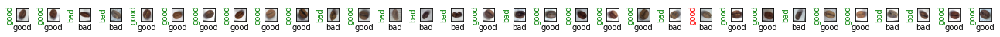

Evaluating at step  40
Val loss: 0.1783, Acc: 0.8724


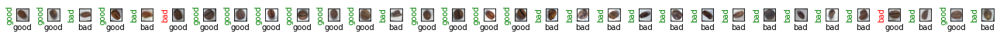

Training Loss: 0.2015


In [ ]:
torch.cuda.empty_cache()
train(epochs=10,model= vgg16)

Starting training . . . .
Starting epoch 1/10
Evaluating at step  0
Val loss: 0.6547, Acc: 0.4870


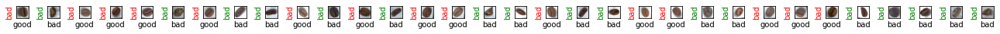

Evaluating at step  20
Val loss: 0.4650, Acc: 0.8594


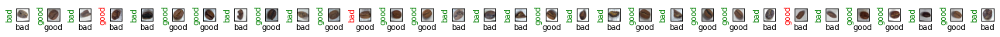

Evaluating at step  40
Val loss: 0.3849, Acc: 0.8672


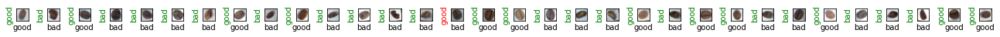

Training Loss: 0.5044
Starting epoch 2/10
Evaluating at step  0
Val loss: 0.3513, Acc: 0.8880


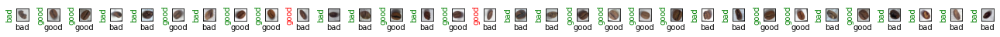

Evaluating at step  20
Val loss: 0.3066, Acc: 0.8359


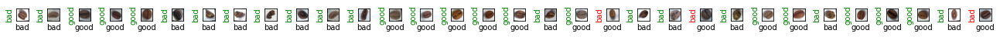

Evaluating at step  40
Val loss: 0.2811, Acc: 0.8724


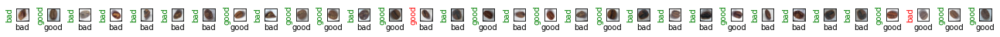

Training Loss: 0.3269
Starting epoch 3/10
Evaluating at step  0
Val loss: 0.2764, Acc: 0.8750


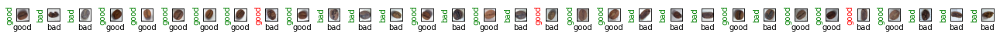

Evaluating at step  20
Val loss: 0.2535, Acc: 0.8880


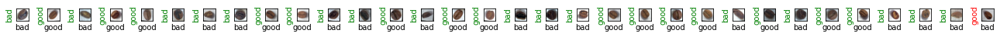

Evaluating at step  40
Val loss: 0.2262, Acc: 0.8906


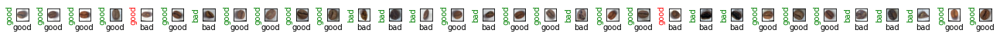

Training Loss: 0.2523
Starting epoch 4/10
Evaluating at step  0
Val loss: 0.1974, Acc: 0.8958


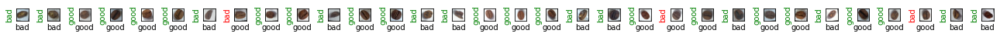

Evaluating at step  20
Val loss: 0.1909, Acc: 0.9036


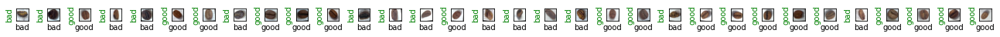

Evaluating at step  40
Val loss: 0.2159, Acc: 0.8724


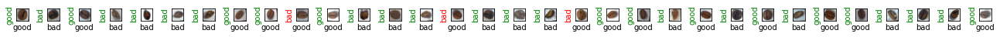

Training Loss: 0.2418
Starting epoch 5/10
Evaluating at step  0
Val loss: 0.1760, Acc: 0.8984


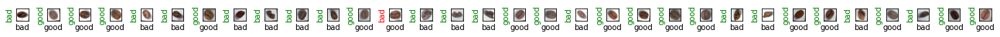

Evaluating at step  20
Val loss: 0.1897, Acc: 0.8906


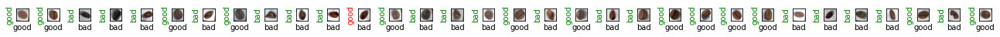

Evaluating at step  40
Val loss: 0.2109, Acc: 0.8750


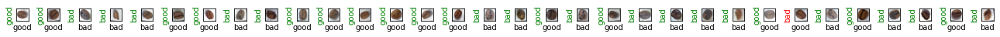

Training Loss: 0.2059
Starting epoch 6/10
Evaluating at step  0
Val loss: 0.2005, Acc: 0.8776


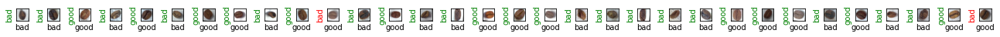

Evaluating at step  20
Val loss: 0.1655, Acc: 0.8958


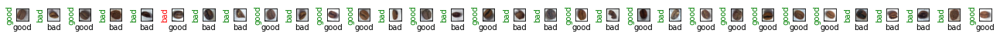

Evaluating at step  40
Val loss: 0.1587, Acc: 0.9010


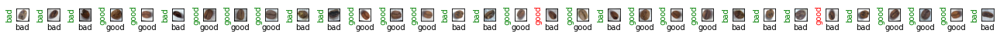

Training Loss: 0.1796
Starting epoch 7/10
Evaluating at step  0
Val loss: 0.1551, Acc: 0.9036


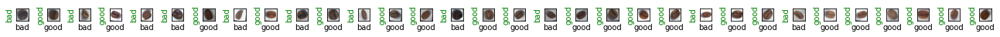

Evaluating at step  20
Val loss: 0.1625, Acc: 0.9115


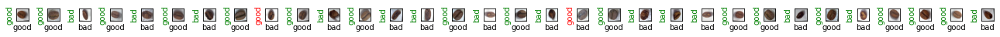

Evaluating at step  40
Val loss: 0.1461, Acc: 0.9089


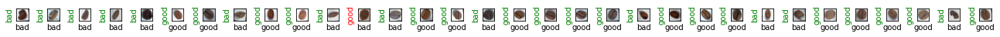

Training Loss: 0.1869
Starting epoch 8/10
Evaluating at step  0
Val loss: 0.1460, Acc: 0.8984


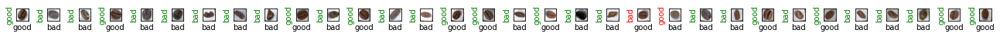

Evaluating at step  20
Val loss: 0.1415, Acc: 0.8932


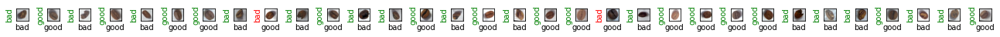

Evaluating at step  40
Val loss: 0.1289, Acc: 0.8984


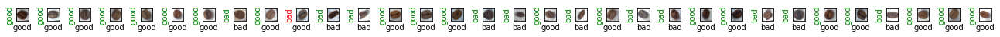

Training Loss: 0.1612
Starting epoch 9/10
Evaluating at step  0
Val loss: 0.1254, Acc: 0.9010


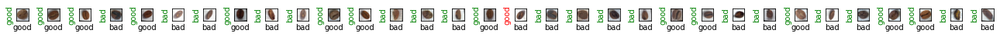

Evaluating at step  20
Val loss: 0.1407, Acc: 0.9062


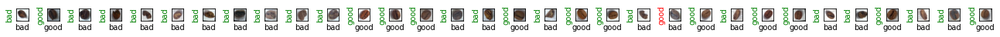

Evaluating at step  40
Val loss: 0.1235, Acc: 0.9141


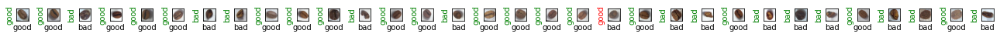

Training Loss: 0.1514
Starting epoch 10/10
Evaluating at step  0
Val loss: 0.1192, Acc: 0.9062


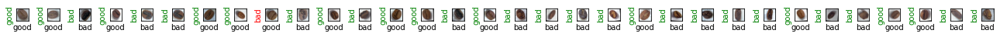

Evaluating at step  20
Val loss: 0.1146, Acc: 0.9115


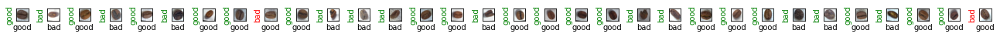

Evaluating at step  40
Val loss: 0.1399, Acc: 0.8958


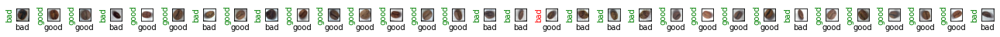

Training Loss: 0.1531


In [ ]:
torch.cuda.empty_cache()
train(epochs=10,model= resnet50)

In [ ]:
torch.save(resnet50.state_dict(), "resnet50_beans.pth")
!cp vgg16_beans.pth drive/MyDrive/

In [ ]:
torch.save(vgg16.state_dict(), "vgg16_beans.pth")
!cp vgg16_beans.pth drive/MyDrive/

In [ ]:
!cp drive/MyDrive/vgg16_beans.pth .

#Evaluate our models

In [ ]:
def get_metrics(model):
    y_true = []
    y_pred = []

    for img, labels in dl_test:
        img = img.to(device)
        labels = labels.to(device)
        with torch.no_grad():
            model.eval()
            out = model(img)
            _, preds = torch.max(out, 1)

            for pr, yt in zip(preds, labels):
                predicted  = f'{class_names[int(pr.cpu().numpy())]}'
                true_label = f'{class_names[int(yt.cpu().numpy())]}'
                y_true.append(true_label)
                y_pred.append(predicted)

    return y_true, y_pred


In [ ]:
from sklearn.metrics import confusion_matrix, classification_report

y_true, y_pred = get_metrics(vgg16)

print(classification_report(y_true, y_pred))
print("Confusion matrix: \n", confusion_matrix(y_true, y_pred))

              precision    recall  f1-score   support

         bad       0.92      0.91      0.92       168
        good       0.92      0.93      0.93       194

    accuracy                           0.92       362
   macro avg       0.92      0.92      0.92       362
weighted avg       0.92      0.92      0.92       362

Confusion matrix: 
 [[153  15]
 [ 13 181]]


In [ ]:
from sklearn.metrics import confusion_matrix, classification_report

y_true, y_pred = get_metrics(resnet50)

print(classification_report(y_true, y_pred))
print("Confusion matrix: \n", confusion_matrix(y_true, y_pred))


              precision    recall  f1-score   support

         bad       0.99      0.93      0.96       181
        good       0.94      0.99      0.97       181

    accuracy                           0.96       362
   macro avg       0.97      0.96      0.96       362
weighted avg       0.97      0.96      0.96       362

Confusion matrix: 
 [[169  12]
 [  1 180]]


#load our pre-trained model

only if weights are saved

In [ ]:
if not torch.cuda.is_available():
    vgg16.load_state_dict(torch.load("vgg16_beans.pth",map_location=torch.device('cpu')))
else:
    vgg16.load_state_dict(torch.load("vgg16_beans.pth"))
vgg16.eval()

VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (7): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (9): ReLU(inplace=True)
    (10): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (12): ReLU(inplace=True)
    (13): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (14): Conv2d(128, 256

# test our model with real data

In [ ]:
valid_transform = torchvision.transforms.Compose([
    torchvision.transforms.Resize(size=(224,224)),
    torchvision.transforms.ToTensor(),
    torchvision.transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                     std =[0.229, 0.224, 0.225])
])


In [ ]:
def infer(img, model):
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = Image.fromarray(img)
    img_tensor = valid_transform(img).to(device)
    if torch.cuda.is_available():
        img_tensor = img_tensor.view(1, 3, 224, 224).cuda()
    else:
        img_tensor = img_tensor.view(1, 3, 224, 224)
    with torch.no_grad():
        model.eval()
        out = model(img_tensor)
        _, pred = torch.max(out, 1)
        name =  f'{class_names[int(pred.cpu().numpy())]}'
    return name



(2340, 4160, 3)


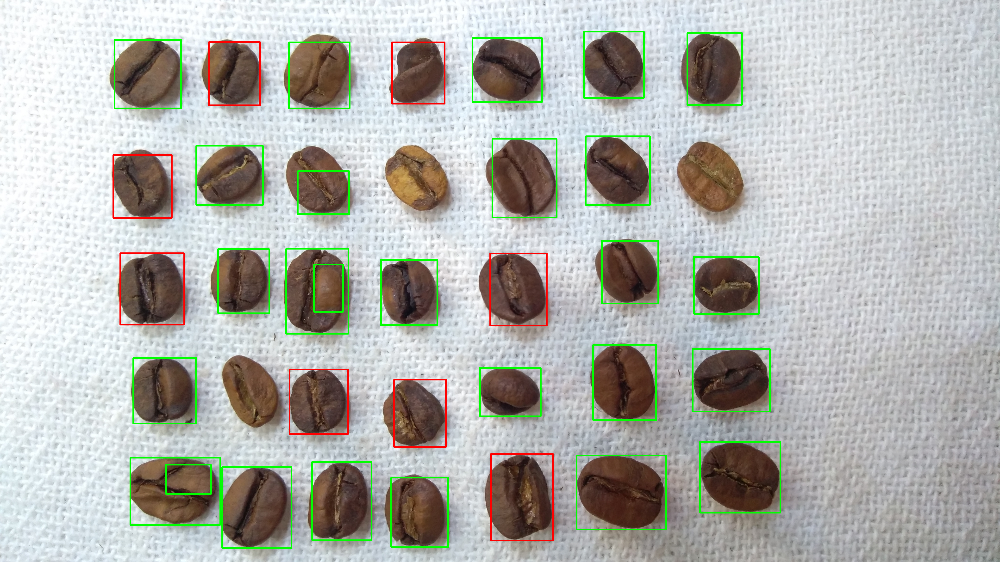

True

In [ ]:
from google.colab.patches import cv2_imshow

path = 'Coffee beans - Dataset/raw/'
images_paths = os.listdir(path)
test_img = random.choice(images_paths)

frame = cv2.imread(path+images_paths[1])

lower_hue = np.array([0,0,0])
upper_hue = np.array([255,255,100])

hsv = cv2.cvtColor(frame, cv2.COLOR_BGR2HSV)
mask = cv2.inRange(hsv, lower_hue, upper_hue)

kernel = np.ones((5,5),np.uint8)

ope = cv2.morphologyEx(mask, cv2.MORPH_OPEN, kernel)
clos = cv2.morphologyEx(ope, cv2.MORPH_CLOSE,kernel )
dil = cv2.dilate(clos, kernel, iterations = 2)

cnt, h = cv2.findContours(dil, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

exp = 100
for pic, contorno in enumerate(cnt):
    area = cv2.contourArea(contorno)
    if area > 10000:
        x, y, w, h = cv2.boundingRect(contorno)
        bean = frame[y:y+h, x:x+w]
        if infer(bean, resnet50) == "bad":
            color = (0,0,255)
        else:
            color = (0,255,0)
        frame  = cv2.rectangle(frame, (x,y), ((x+w), (y+h)), color, 5)

print(frame.shape)
cv2_imshow(frame)

cv2.imwrite("test_img_vgg.png", frame)
